In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import nbformat


In [4]:
Crop = pd.read_csv(r"C:\Users\91958\Downloads\Crop Production data.csv")
df = pd.DataFrame(Crop)
df

,State_Name,District_Name,Crop_Year,Season,Crop,Area,Production
0,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Arecanut,1254.0,2000.0
1,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Other Kharif pulses,2.0,1.0
2,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Rice,102.0,321.0
3,Andaman and Nicobar Islands,NICOBARS,2000,Whole Year,Banana,176.0,641.0
4,Andaman and Nicobar Islands,NICOBARS,2000,Whole Year,Cashewnut,720.0,165.0
...,...,...,...,...,...,...,...
246086,West Bengal,PURULIA,2014,Summer,Rice,306.0,801.0
246087,West Bengal,PURULIA,2014,Summer,Sesamum,627.0,463.0
246088,West Bengal,PURULIA,2014,Whole Year,Sugarcane,324.0,16250.0
246089,West Bengal,PURULIA,2014,Winter,Rice,279151.0,597899.0


In [5]:
df.head()

,State_Name,District_Name,Crop_Year,Season,Crop,Area,Production
0,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Arecanut,1254.0,2000.0
1,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Other Kharif pulses,2.0,1.0
2,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Rice,102.0,321.0
3,Andaman and Nicobar Islands,NICOBARS,2000,Whole Year,Banana,176.0,641.0
4,Andaman and Nicobar Islands,NICOBARS,2000,Whole Year,Cashewnut,720.0,165.0


In [6]:
df.shape

(246091, 7)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 246091 entries, 0 to 246090
Data columns (total 7 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   State_Name     246091 non-null  object 
 1   District_Name  246091 non-null  object 
 2   Crop_Year      246091 non-null  int64  
 3   Season         246091 non-null  object 
 4   Crop           246091 non-null  object 
 5   Area           246091 non-null  float64
 6   Production     242361 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 13.1+ MB


In [8]:
df.isnull().sum()

State_Name          0
District_Name       0
Crop_Year           0
Season              0
Crop                0
Area                0
Production       3730
dtype: int64

In [9]:
df.duplicated().sum()

0

In [10]:
df.dropna(inplace  = True)
df

,State_Name,District_Name,Crop_Year,Season,Crop,Area,Production
0,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Arecanut,1254.0,2000.0
1,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Other Kharif pulses,2.0,1.0
2,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Rice,102.0,321.0
3,Andaman and Nicobar Islands,NICOBARS,2000,Whole Year,Banana,176.0,641.0
4,Andaman and Nicobar Islands,NICOBARS,2000,Whole Year,Cashewnut,720.0,165.0
...,...,...,...,...,...,...,...
246086,West Bengal,PURULIA,2014,Summer,Rice,306.0,801.0
246087,West Bengal,PURULIA,2014,Summer,Sesamum,627.0,463.0
246088,West Bengal,PURULIA,2014,Whole Year,Sugarcane,324.0,16250.0
246089,West Bengal,PURULIA,2014,Winter,Rice,279151.0,597899.0


In [11]:
df.isnull().sum()

State_Name       0
District_Name    0
Crop_Year        0
Season           0
Crop             0
Area             0
Production       0
dtype: int64

In [12]:
df.columns

Index(['State_Name', 'District_Name', 'Crop_Year', 'Season', 'Crop', 'Area',
       'Production'],
      dtype='object')

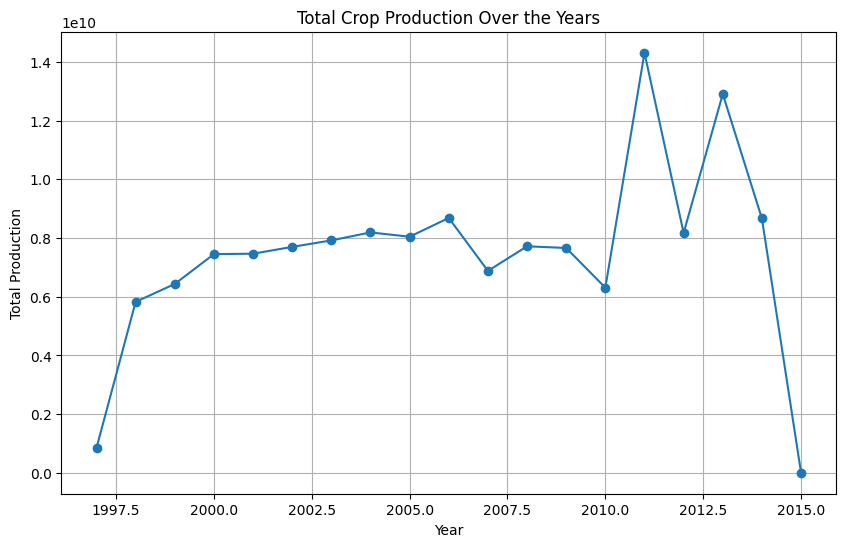

In [13]:

# Plot the crop production over the years
plt.figure(figsize=(10, 6))
df.groupby('Crop_Year')['Production'].sum().plot(kind='line', marker='o')
plt.title('Total Crop Production Over the Years')
plt.xlabel('Year')
plt.ylabel('Total Production')
plt.grid(True)
plt.show()






In [14]:
df

,State_Name,District_Name,Crop_Year,Season,Crop,Area,Production
0,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Arecanut,1254.0,2000.0
1,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Other Kharif pulses,2.0,1.0
2,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Rice,102.0,321.0
3,Andaman and Nicobar Islands,NICOBARS,2000,Whole Year,Banana,176.0,641.0
4,Andaman and Nicobar Islands,NICOBARS,2000,Whole Year,Cashewnut,720.0,165.0
...,...,...,...,...,...,...,...
246086,West Bengal,PURULIA,2014,Summer,Rice,306.0,801.0
246087,West Bengal,PURULIA,2014,Summer,Sesamum,627.0,463.0
246088,West Bengal,PURULIA,2014,Whole Year,Sugarcane,324.0,16250.0
246089,West Bengal,PURULIA,2014,Winter,Rice,279151.0,597899.0


# Crop Production over the years

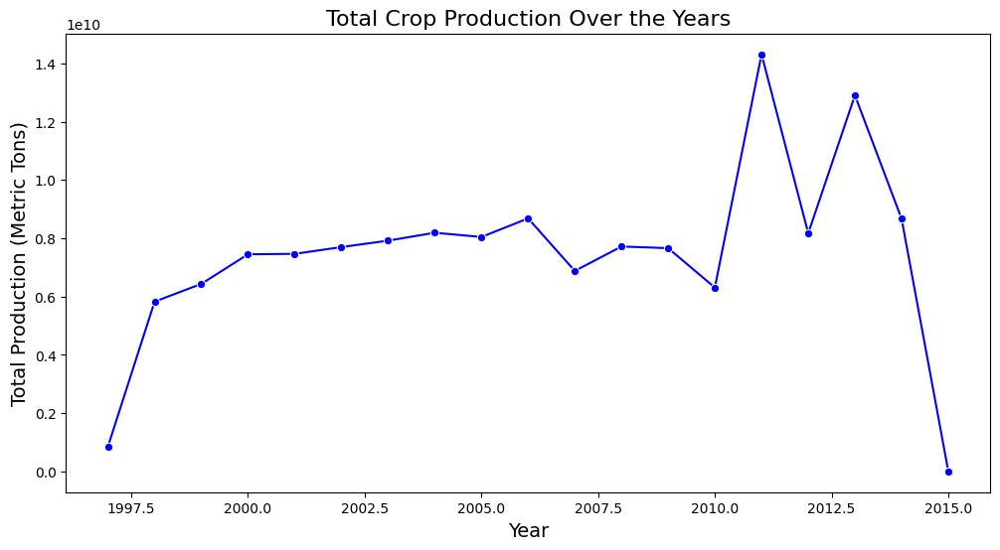

In [15]:
yearly_production = df.groupby('Crop_Year')['Production'].sum().reset_index()

plt.figure(figsize=(12, 6))

sns.lineplot(x='Crop_Year', y='Production', data=yearly_production, marker='o', color='b')

# Set the title and labels
plt.title('Total Crop Production Over the Years', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Total Production (Metric Tons)', fontsize=14)

plt.show()

# Seasonal crop production over the years

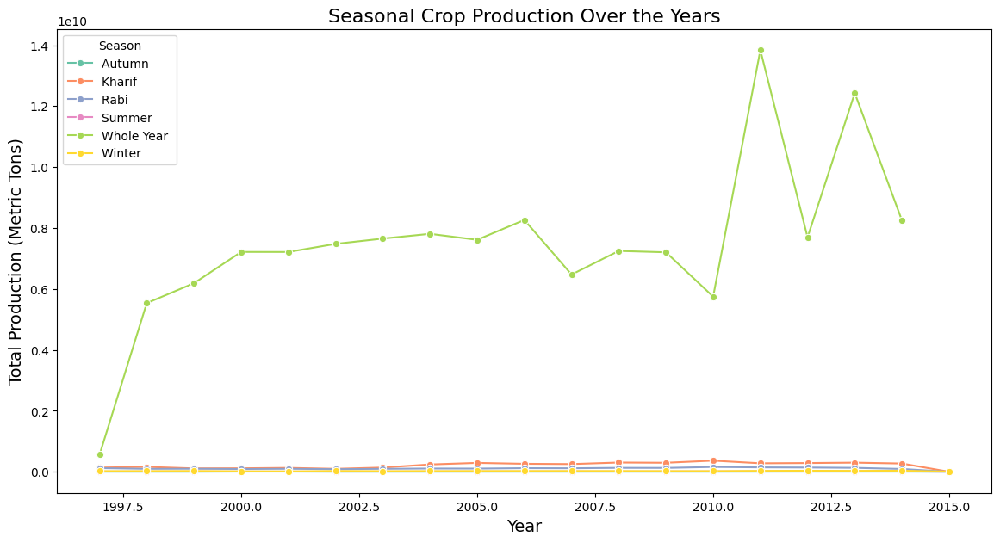

In [16]:
# Aggregate data to get total production per year per season
season_yearly_production = df.groupby(['Crop_Year', 'Season'])['Production'].sum().reset_index()

# Set up the figure size
plt.figure(figsize=(14, 7))

# Create a line plot
sns.lineplot(x='Crop_Year', y='Production', hue='Season', data=season_yearly_production, marker='o', palette='Set2')

# Set the title and labels
plt.title('Seasonal Crop Production Over the Years', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Total Production (Metric Tons)', fontsize=14)

# Show the plot
plt.show()


# Total crop production by state

C:\Users\91958\AppData\Local\Temp\ipykernel_19116\2036579499.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Production', y='State_Name', data=state_production, palette='viridis')


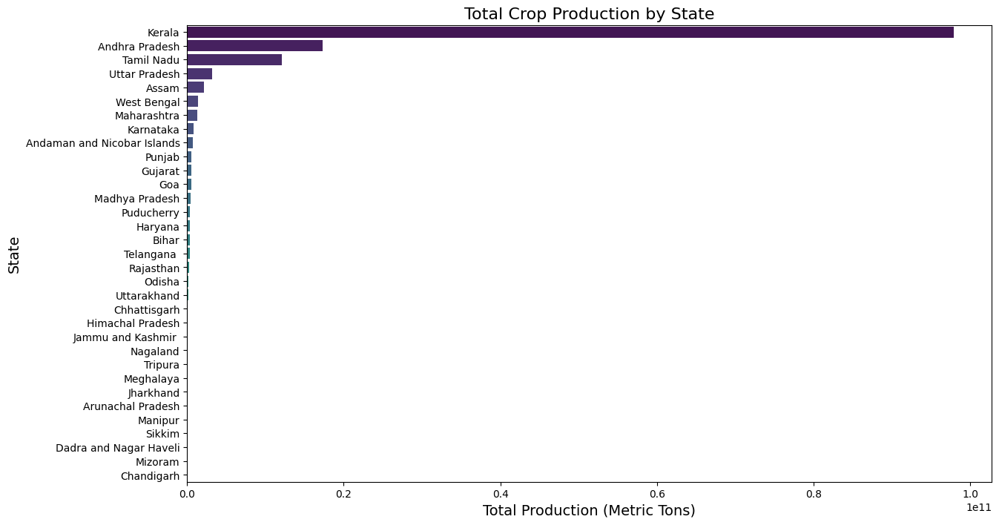

In [17]:
state_production = df.groupby('State_Name')['Production'].sum().reset_index()

state_production = state_production.sort_values(by='Production', ascending=False)

plt.figure(figsize=(14, 8))

sns.barplot(x='Production', y='State_Name', data=state_production, palette='viridis')

# Set the title and labels
plt.title('Total Crop Production by State', fontsize=16)
plt.xlabel('Total Production (Metric Tons)', fontsize=14)
plt.ylabel('State', fontsize=14)

plt.show()


# Poduction over the area

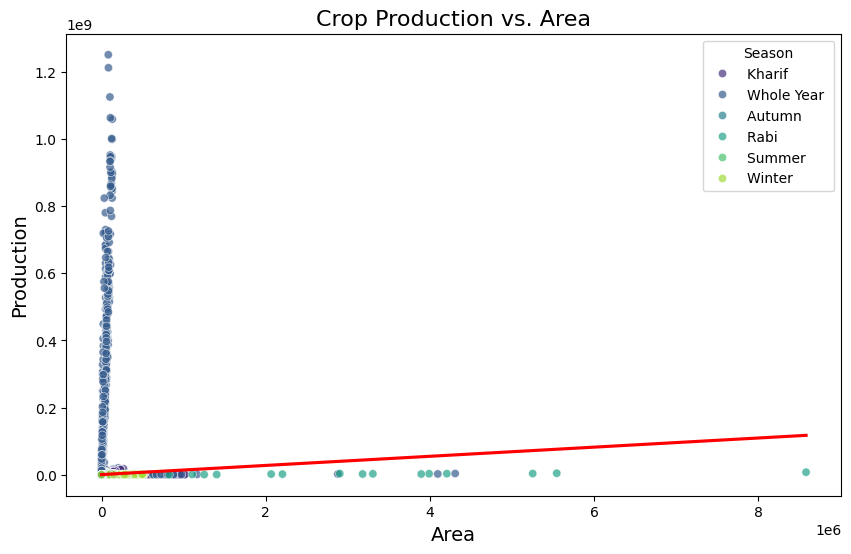

In [18]:
plt.figure(figsize=(10, 6))

sns.scatterplot(x='Area', y='Production', data=df, hue='Season', palette='viridis', alpha=0.7)

plt.title('Crop Production vs. Area', fontsize=16)
plt.xlabel('Area (Hectares)', fontsize=14)
plt.ylabel('Production (Metric Tons)', fontsize=14)

# Optionally, add a trend line using linear regression
sns.regplot(x='Area', y='Production', data=df, scatter=False, color='red', ci=None)

plt.show()


# Crop production during the particular seasons

C:\Users\91958\AppData\Local\Temp\ipykernel_19116\1014197218.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Season', y='Production', data=season_production, palette='magma')


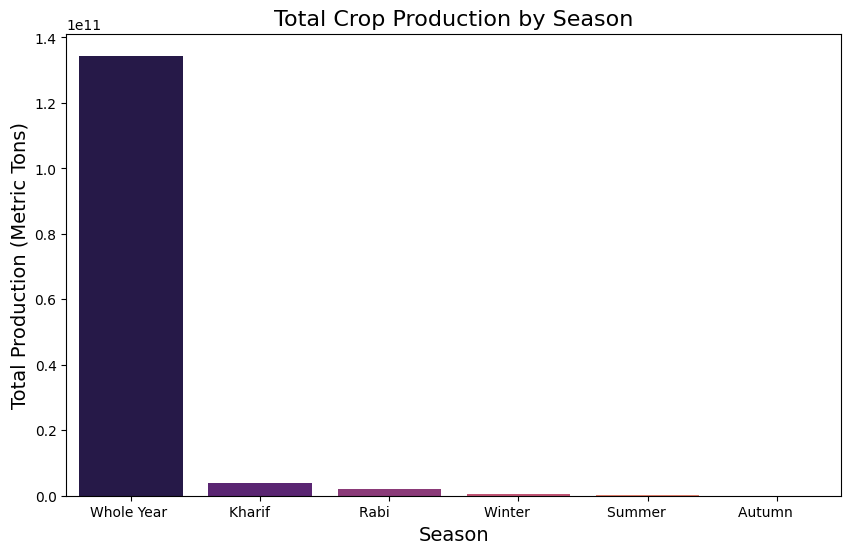

In [19]:
season_production = df.groupby('Season')['Production'].sum().reset_index()

# Sort the seasons by production for better visualization
season_production = season_production.sort_values(by='Production', ascending=False)

plt.figure(figsize=(10, 6))

sns.barplot(x='Season', y='Production', data=season_production, palette='magma')

plt.title('Total Crop Production by Season', fontsize=16)
plt.xlabel('Season', fontsize=14)
plt.ylabel('Total Production (Metric Tons)', fontsize=14)

plt.show()


In [20]:
df

,State_Name,District_Name,Crop_Year,Season,Crop,Area,Production
0,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Arecanut,1254.0,2000.0
1,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Other Kharif pulses,2.0,1.0
2,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Rice,102.0,321.0
3,Andaman and Nicobar Islands,NICOBARS,2000,Whole Year,Banana,176.0,641.0
4,Andaman and Nicobar Islands,NICOBARS,2000,Whole Year,Cashewnut,720.0,165.0
...,...,...,...,...,...,...,...
246086,West Bengal,PURULIA,2014,Summer,Rice,306.0,801.0
246087,West Bengal,PURULIA,2014,Summer,Sesamum,627.0,463.0
246088,West Bengal,PURULIA,2014,Whole Year,Sugarcane,324.0,16250.0
246089,West Bengal,PURULIA,2014,Winter,Rice,279151.0,597899.0


# Heatmap of Crop Production by State and Season

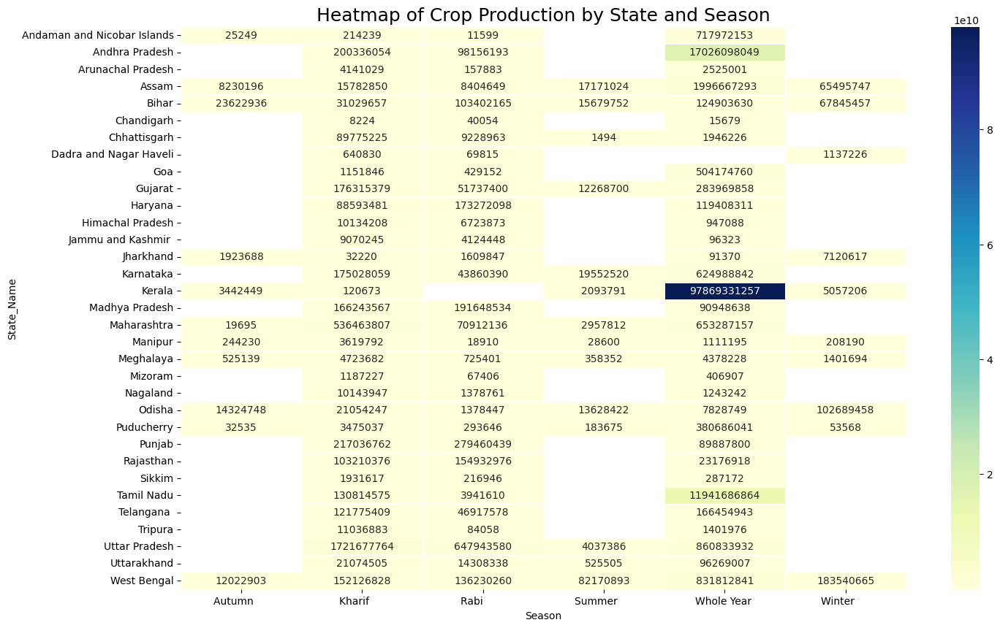

In [21]:
state_season_production = df.groupby(['State_Name', 'Season'])['Production'].sum().unstack()

plt.figure(figsize=(16, 10))

sns.heatmap(state_season_production, cmap='YlGnBu', annot=True, fmt='.0f', linewidths=.5)

plt.title('Heatmap of Crop Production by State and Season', fontsize=18)

plt.show()


In [22]:
import plotly.express as px
import nbformat

# Interactive plot for crop production over the years
fig = px.line(df, x='Crop_Year', y='Production', color='State_Name', title='Crop Production Over the Years by State')
fig.show()

# Interactive scatter plot for Area vs Production
fig = px.scatter(df, x='Area', y='Production', color='Season', title='Area vs Production by Season')
fig.show()
